In [1]:
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import scipy.io
import glob,csv

from pykrige.ok import OrdinaryKriging
from mpl_toolkits.basemap import Basemap
%matplotlib inline

In [2]:
data=scipy.io.loadmat('ANHA4_Th_part.mat')
NEMO_dep=data['NEMO_dep']
Pa_diss=data['Th_part']
#print Pa_diss.shape
lons=data['lons']
lats=data['lats']
Pa_ini=np.empty([1,50,800,544])

coordinate_name=glob.glob('/ocean/xiaoxiny/research/data/Jasper/ANHA4_IC_T.nc')
coordinate_obj=nc.Dataset(coordinate_name[0])
nav_lon=coordinate_obj.variables['nav_lon'][:]
nav_lat=coordinate_obj.variables['nav_lat'][:]
ANHAdep=coordinate_obj.variables['deptht'][:]
#print ANHAdep
print ANHAdep[43]

3220.82


In [3]:
nav_lon10=nav_lon[::10,::10]
nav_lat10=nav_lat[::10,::10]

In [4]:
masked_name=glob.glob('/ocean/xiaoxiny/research/NEMO-code/NEMOGCM/CONFIG/myANHA/EXP00/ANHA4-EXH001_y2008m01d05_gridT.nc')
masked=nc.Dataset(masked_name[0])
mask=masked.variables['vosaline'][:]

In [5]:
'input boundinglat'
latlim=45
lim=45

In [5]:
what=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
            #layer,distance,variance
whatt=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
x_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
            #layer,x,y
y_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
z_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
def find(layer):
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]
        
        x_ma=np.ma.masked_where(z<= 1e-200,x)
        x_ma=np.ma.masked_where(np.isnan(x_ma),x_ma)
        y_ma=np.ma.masked_where(z<= 1e-200,y)
        y_ma=np.ma.masked_where(np.isnan(y_ma),y_ma)
        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(y_ma),z_ma)        
        #x_ma=x_ma.compressed()
        #y_ma=y_ma.compressed()
        #z_ma=z_ma.compressed()
        
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        xx_lon_ma=np.ma.masked_where(nav_lat<45,xx_lon)
        yy_lat_ma=np.ma.masked_where(nav_lat<45,yy_lat)

        xx_dis=np.ma.masked_where(np.isnan(xx_dis),xx_dis)
        yy_dis=np.ma.masked_where(np.isnan(yy_dis),yy_dis)
        z_ma=np.ma.masked_where(np.isnan(yy_dis),z_ma)
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis.compressed()
        yyy_dis=yy_dis.compressed()
        zzz_ma=z_ma.compressed()
        
        for applen in range(len(xxx_dis)):
            x_all.append(xxx_dis[applen])
            y_all.append(yyy_dis[applen])
            z_all.append(zzz_ma[applen])
        #print z_all

In [6]:
for i in range (43):#no data below layer 43
    find(i)

Plotting Enabled

Adjusting data for anisotropy...
Initializing variogram model...
Using 'linear' Variogram Model
Slope: 1.94799796369e-15
Nugget: 0.00143326667123 



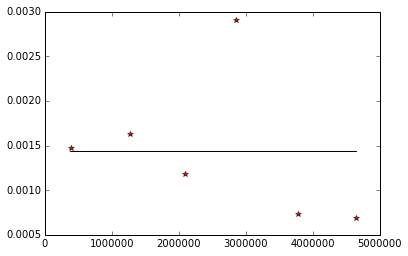

/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:239: RuntimeWarning: invalid value encountered in sqrt
  sigma[n] = np.sqrt(ss_)
/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:243: RuntimeWarning: divide by zero encountered in divide
  epsilon = delta/sigma


Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 

Updating variogram mode...
Using 'linear' Variogram Model
Slope: 5.42430230846e-10
Nugget: 0.000630823281214 



/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:243: RuntimeWarning: invalid value encountered in divide
  epsilon = delta/sigma
/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:257: RuntimeWarning: divide by zero encountered in log
  return Q2 * np.exp(np.sum(np.log(sigma**2))/sigma.shape[0])


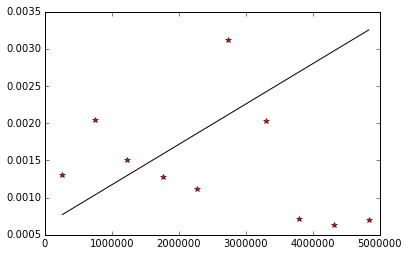

Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 



In [7]:
OK = OrdinaryKriging(x_all,y_all, z_all, variogram_model='linear', verbose=True, enable_plotting=True)
OK.update_variogram_model('linear',variogram_parameters=None,nlags=10,anisotropy_angle=0)

In [6]:
'''Input slope and intercept'''
slope=5.42430230846e-10
inter=0.000630823281214

In [7]:
def write_nc(layer):
        '''a function for  interpolation'''
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]

        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(z_ma),z)
        x_ma=np.ma.masked_where(np.isnan(z_ma),x)
        y_ma=np.ma.masked_where(np.isnan(z_ma),y)

        print ('z_ma %s'%z_ma)
        print ('x_ma %s'%x_ma)
        print ('y_ma %s'%y_ma)
      
        x_ma=x_ma.compressed()
        y_ma=y_ma.compressed()
        z_ma=z_ma.compressed()
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis#.compressed()
        yyy_dis=yy_dis#.compressed()
        zzz_ma=z_ma#.compressed()
        
        print ('zzz_ma %s'%zzz_ma.shape)
        print ('xxx_dis %s'%xxx_dis.shape)
        print ('yyy_dis %s'%yyy_dis.shape)
        
        OK = OrdinaryKriging(xxx_dis,yyy_dis, zzz_ma, variogram_model='linear', verbose=False, enable_plotting=False)
        OK.update_variogram_model('linear',variogram_parameters=[slope,inter],nlags=7,anisotropy_angle=0)
        
        Pa_interp, ss = OK.execute('points',xx_lon, yy_lat)
        Pa_interp=Pa_interp.reshape(800,544)
        Pa_interp=np.ma.masked_where(np.ma.getmask(mask[0,layer,:,:]),Pa_interp)
        #print Pa_interp
        
        fig=plt.figure(figsize=(8, 8)); ax=plt.gca()
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        m.drawcoastlines()
        m.fillcontinents(color = '0.9',alpha=0.95)
        m.drawparallels(np.arange(-80.,81.,10.),labels=[1, 0, 0, 0])
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[0, 0, 0, 1])
        x,y = m(nav_lon, nav_lat)
        x10,y10 = m(nav_lon10, nav_lat10)
        m.plot(x10[-50:,:],y10[-50:,:],x10[-50:,:].T,y10[-50:,:].T,color='k',linewidth=0.1,)
        #plt.plot(x[300:-1,:],y[300:-1,:],x[300:-1,:].T,y[300:-1,:].T,color='k',linewidth=0.1,)
        CS = m.pcolor(x[300:-1,:],y[300:-1,:],Pa_interp[300:-1,:],cmap=plt.cm.YlOrBr)
        CBar = plt.colorbar(CS, shrink=0.8)
        #m.scatter(x[0,90],y[0,90],color='yellow',s=100)
        x_mma=x_ma#.compressed()
        y_mma=y_ma#.compressed()
        for j in range(len(x_mma)):
            x2,y2= m(x_mma[j], y_mma[j])
            cmm = plt.cm.get_cmap('YlOrBr')
            m.scatter(x2,y2,c=zzz_ma[j],vmin=np.min(Pa_interp[300:-1,:]),vmax=np.max(Pa_interp[300:-1,:]),cmap=cmm,s=40)
        #fig.savefig('Part. Pa (Layer:%s).pdf'%layer)
        plt.title('Part. Th (Layer %s, Depth %.2f m)'%(layer+1,ANHAdep[layer]))
        fig.savefig('/ocean/xiaoxiny/research/writings/Figures/PartTh/Part. Th (Layer %s).png'%layer,dpi=100)
        
        Pa_ini[-1,layer,:,:]=Pa_interp
        if layer==43:
            Pa_ini[-1,43:-1,:,:]=Pa_interp
            Pa_ini[-1,-1,:,:]=Pa_interp
            print 'set values of layer 43 for the rest'
        plt.show()

#part Th interpolation_result

z_ma [ 0.012       0.02        0.013       0.013       0.175       0.047       0.054
  0.02        0.015       0.048       0.028       0.036       0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


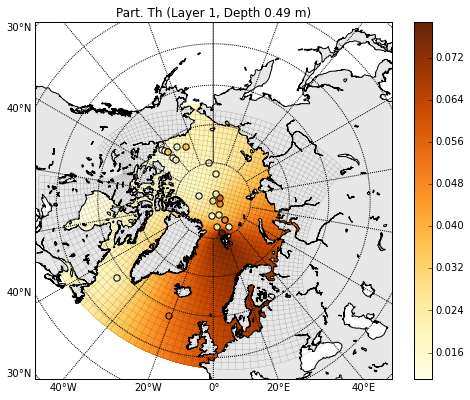

z_ma [ 0.012       0.02        0.013       0.013       0.175       0.047       0.054
  0.02        0.015       0.048       0.028       0.036       0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


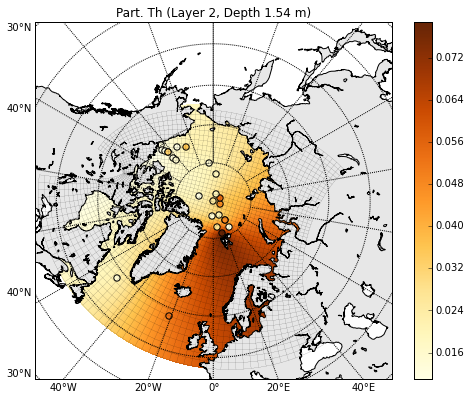

z_ma [ 0.012       0.02        0.013       0.013       0.175       0.047       0.054
  0.02        0.015       0.048       0.028       0.036       0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


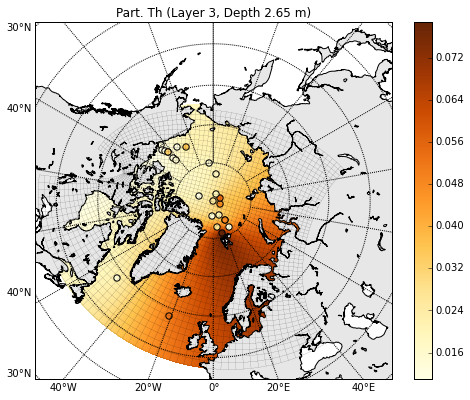

z_ma [ 0.012       0.02        0.013       0.013       0.175       0.047       0.054
  0.02        0.015       0.048       0.028       0.036       0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


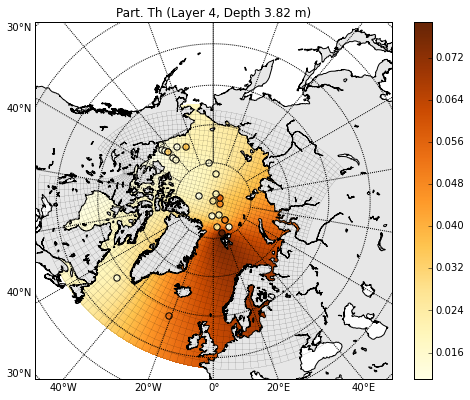

z_ma [ 0.012       0.02        0.013       0.013       0.175       0.047       0.054
  0.02        0.015       0.048       0.028       0.03592702  0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


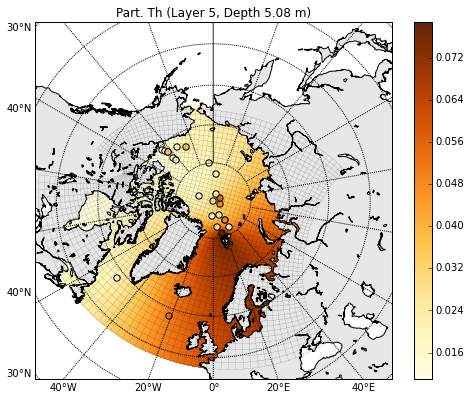

z_ma [ 0.012       0.02        0.013       0.013       0.175       0.047       0.054
  0.02        0.015       0.048       0.028       0.03592702  0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


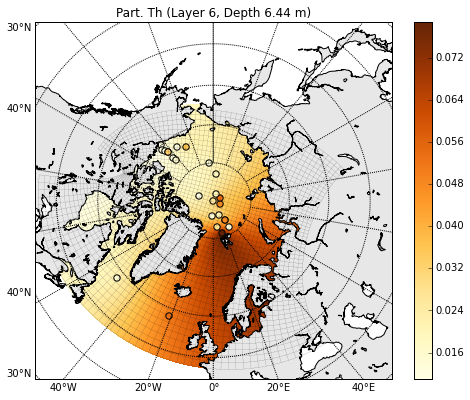

z_ma [ 0.012       0.01988613  0.013       0.013       0.17396506  0.047       0.054
  0.02        0.015       0.048       0.028       0.03573602  0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


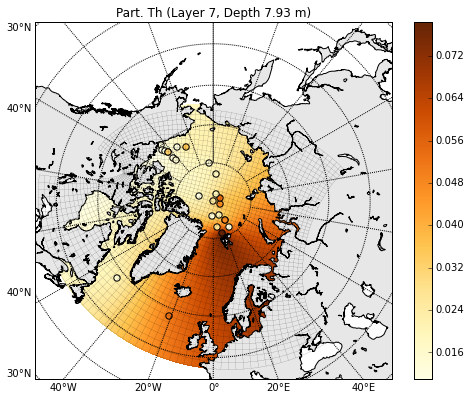

z_ma [ 0.012       0.01975349  0.013       0.013       0.17275961  0.047       0.054
  0.02        0.015       0.048       0.028       0.03554503  0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


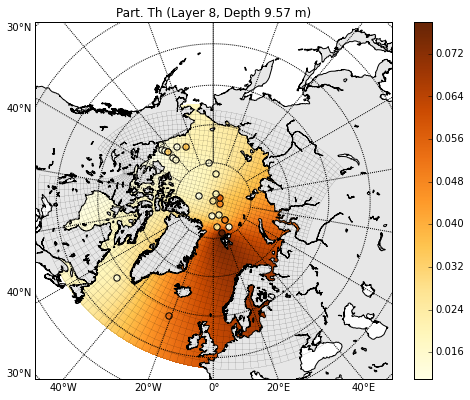

z_ma [ 0.012       0.01962086  0.013       0.013       0.17155415  0.047       0.054
  0.02        0.015       0.048       0.028       0.03535403  0.053       0.015
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


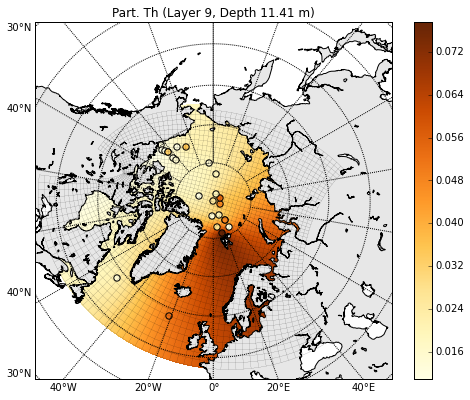

z_ma [ 0.012       0.01948822  0.013       0.013       0.1703487   0.047       0.054
  0.02        0.015       0.048       0.028       0.03516304  0.053       0.015
  0.013       0.0122      0.01465208  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


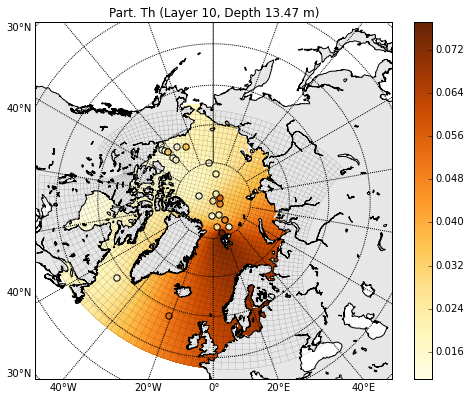

z_ma [ 0.012       0.01935559  0.013       0.013       0.16914324  0.047       0.054
  0.02        0.015       0.048       0.028       0.03497205  0.053       0.015
  0.013       0.0122      0.01472471  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


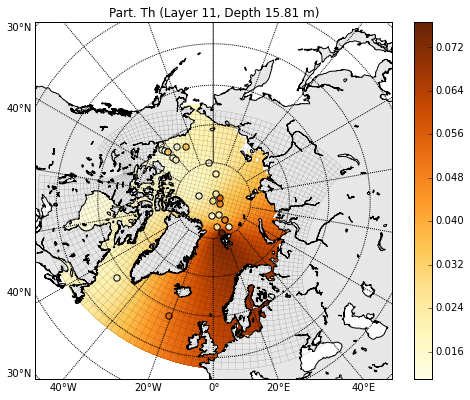

z_ma [ 0.012       0.01909032  0.013       0.013       0.16673233  0.047       0.054
  0.02        0.015       0.048       0.028       0.03459006  0.053       0.015
  0.013       0.0122      0.01486998  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


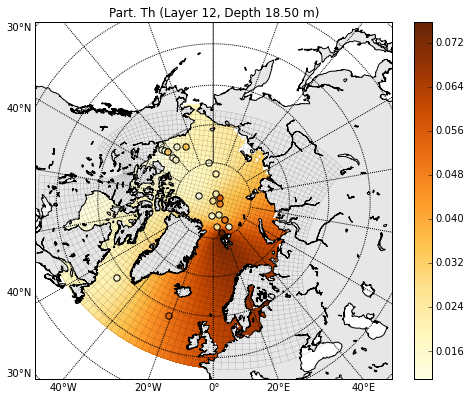

z_ma [ 0.012       0.01895768  0.013       0.013       0.16552688  0.047       0.054
  0.02        0.015       0.048       0.028       0.03439906  0.053       0.015
  0.013       0.0122      0.01494261  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


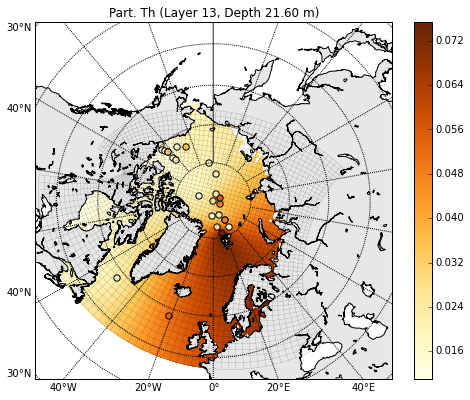

z_ma [ 0.012       0.01869241  0.013       0.013       0.16311597  0.047       0.054
  0.02        0.015       0.048       0.028       0.03401708  0.053       0.015
  0.013       0.0122      0.01508787  0.01908878  0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


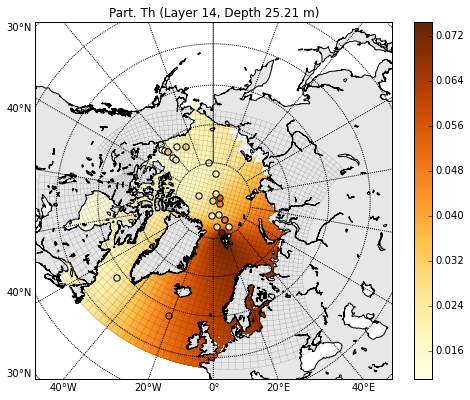

z_ma [ 0.012       0.01842714  0.013       0.013       0.16070506  0.047       0.054
  0.02        0.015       0.048       0.028       0.03181052  0.053       0.015
  0.013       0.0122      0.01523314  0.0186686   0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


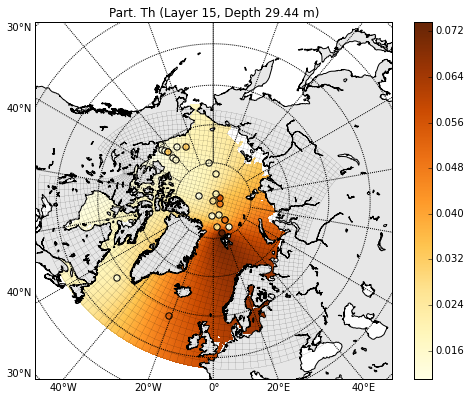

z_ma [ 0.012       0.01802924  0.013       0.013       0.15708869  0.047       0.054
  0.02        0.015       0.048       0.028       0.02837262  0.053
  0.01606346  0.013       0.0122      0.01545103  0.01849953  0.0258
  0.00325608  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


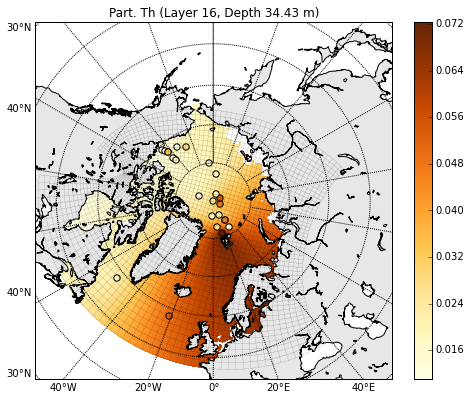

z_ma [0.012 0.017631334366501075 0.013000000000000001 0.013000000000000001
 0.15347232414406875 0.047 0.054000000000000006 0.02 0.015 0.048
 0.027999999999999997 0.028255439256119223 0.053 0.017454990672579104 --
 0.0122 0.015668925631414626 0.0189800916554258 0.025800000000000003
 0.0032560804 0.0055139636 0.0092251064 0.0329217954 0.0128635892
 0.0158408651]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


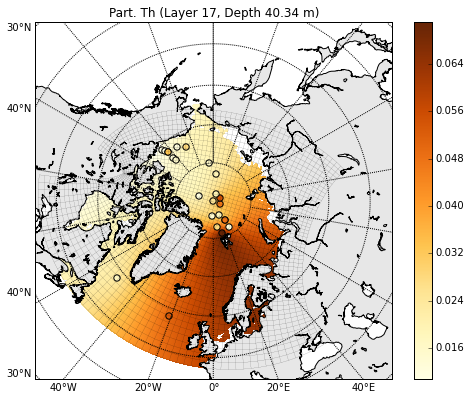

z_ma [0.012 0.017100794880755246 0.013000000000000001 0.013000000000000001
 0.14865050298181487 0.047 0.054000000000000006 0.02 0.015 0.048
 0.027999999999999997 0.02863742768585622 0.053 0.019310363045587368 --
 0.0122 0.01595945204276389 0.019620846440791085 0.025800000000000003
 0.0032560804 0.0055139636 0.0092251064 0.0329217954 0.0128635892
 0.0158408651]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


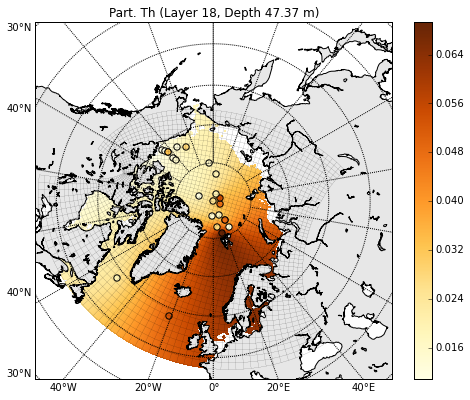

z_ma [0.012 0.01657025539500942 0.013318400863882895 0.013305338264338983
 0.143828681819561 0.047 0.054000000000000006 0.020443039834531072
 0.015311325289129941 0.048 0.027999999999999997 0.029543651236610118 0.053
 0.021165735418595635 -- 0.0122 0.016249978454113155 0.02026160122615637
 0.025800000000000003 0.0032957237043771542 0.0054787289401135785
 0.009464783252604315 0.0329217954 0.0136755739414846 0.016870155575518773]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


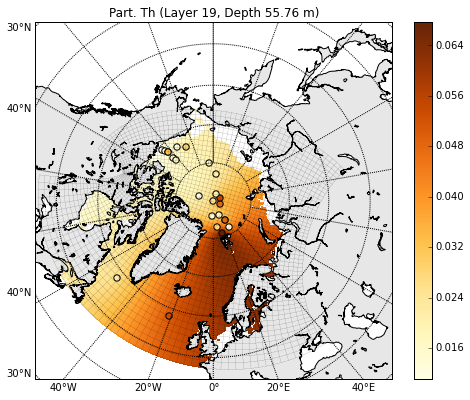

z_ma [0.012 0.015907081037827134 0.013882701953267094 0.013846488539799726
 0.13780140536674365 0.047 0.054000000000000006 0.021228238273434896
 0.0158630863543056 0.048 0.027999999999999997 0.04291324627740497 0.053
 0.023484950884855964 -- 0.0122 0.016613136468299733 0.020919380330552895
 0.025800000000000003 0.0033659834378904564 0.005416282636684885
 0.0098895619651223 0.0329217954 0.01511465255639574 0.01869436462302201]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


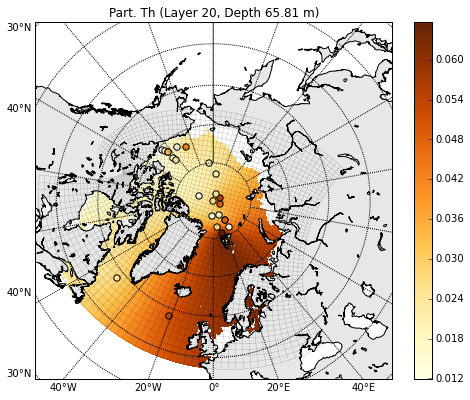

z_ma [0.012 0.014978636937771937 0.014672723478404972 0.014604098925444767
 0.12936321833279935 0.047 0.054000000000000006 0.02232751608790025
 0.016635551845551527 0.048 0.027999999999999997 0.061630679334517754 0.053
 0.026731852537620428 -- 0.0122 0.017121557688160947 0.021053076280960842
 0.025800000000000003 0.00346434706480908 0.005328857811884715
 0.010484252162647478 0.0329217954 0.017129362617271333
 0.021248257289526545]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


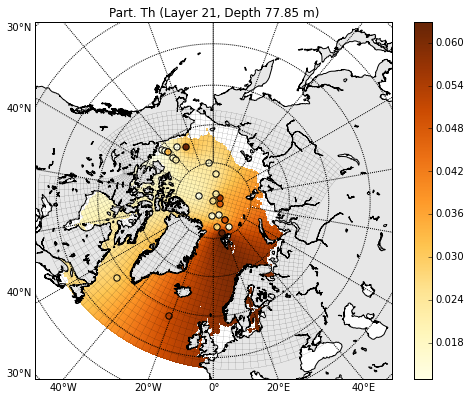

z_ma [0.012 0.01405019283771674 0.01546274500354285 0.015361709311089808
 0.12092503129885507 0.047 0.054000000000000006 0.023426793902365604
 0.01740801733679745 0.048 0.027999999999999997 0.07829358219566779 0.053
 0.02997875419038489 -- 0.013095253773827387 0.021031205948857958
 0.021186772231368788 0.025800000000000003 0.0035627106917277035
 0.005241432987084544 0.011078942360172659 0.0329217954
 0.019144072678146926 0.023802149956031075]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


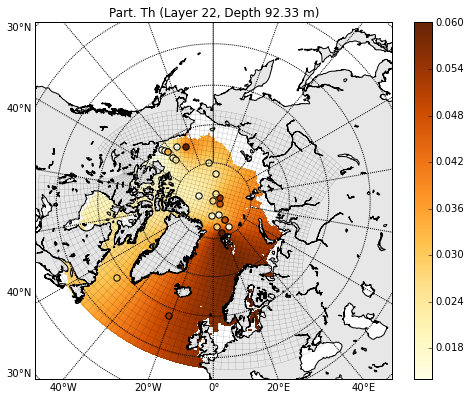

z_ma [0.012 0.012856478994788628 0.016478486964434404 0.016335779806919148
 0.11007593368378385 0.047 0.054000000000000006 0.024840151092392487
 0.01840118725411364 0.048 0.027999999999999997 0.09706978270350933 0.053
 0.03147709190531793 -- 0.01441311385642002 0.02060927987728813
 0.02204771698211342 0.02586169428522267 0.003689178212051648
 0.005129029640912896 0.011843544042705031 0.0329217954
 0.021734414184986974 0.027085726241536903]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


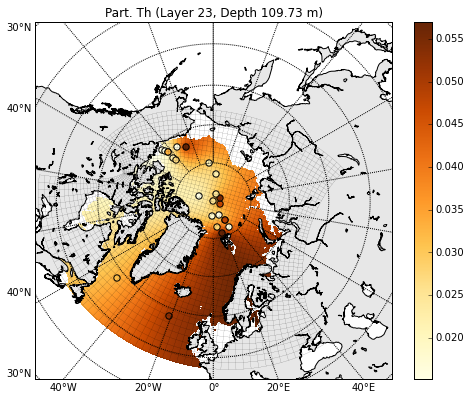

z_ma [0.012 0.011397495408987603 0.017719949361079644 0.017526310412932785
 0.09681592548758568 0.047 0.054000000000000006 0.026567587657980903
 0.01961506159750009 0.048 0.027999999999999997 0.12001847221309346 0.053
 0.030238078152453062 -- 0.014429014049605076 0.023258286596551207
 0.02472538097487766 0.02605045412696449 0.0038437496257809137
 0.00499164777336977 0.0127780572102446 0.0329217954 0.02490038713779148
 0.031098986146044026]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


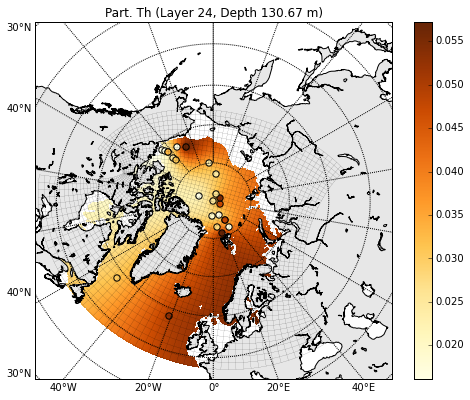

z_ma [0.01770326918403605 0.010687986643985497 0.019299992411355396
 0.019041531184222867 0.0799395514196971 0.047 0.054000000000000006
 0.028766143286911613 0.02115999257999194 0.048 0.027999999999999997
 0.14124397072089503 0.053 0.028661151557897772 -- 0.014333516942170828
 0.026427068944930212 0.027977837421067443 0.02629069392554499
 0.003960249281860881 0.005003299369031726 0.01396743760529496 0.0329217954
 0.028929807259542667 0.03620677147905309]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


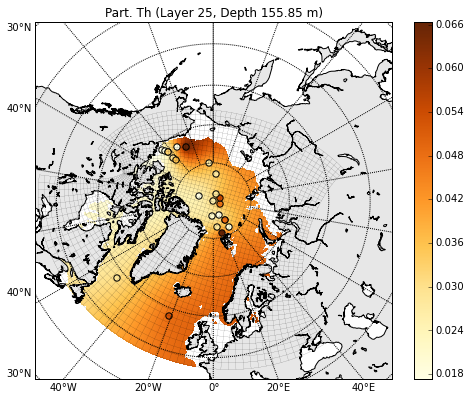

z_ma [0.023842368947666337 0.013667496395934061 0.02099289567950799
 0.0206649820106051 0.061857722061245055 0.047 0.054000000000000006
 0.031121738603623085 0.022815275775518923 0.048 0.027999999999999997
 0.13796978418029224 0.053 0.026971587349445676 -- 0.014231198612776991
 0.027819060680412483 0.02992597841272612 0.026548093709738377
 0.003823581461469579 0.005623653869464358 0.015241773742848914
 0.0329217954 0.03324704310427608 0.041679398621562794]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


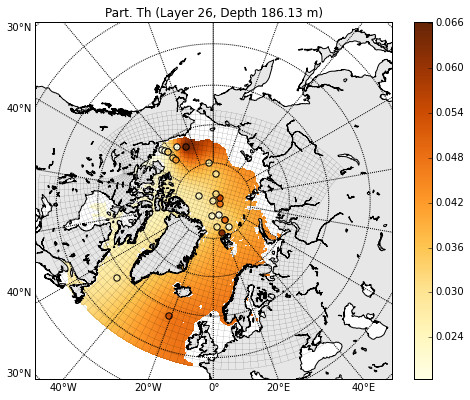

z_ma [0.04377621044824187 0.01764017606519882 0.023250100037044787
 0.022829583112448072 0.037748616249975636 0.047 0.054000000000000006
 0.03426253235923839 0.02502232003622156 0.048 0.027999999999999997
 0.13360420212615515 0.053 0.024718835071509546 -- 0.014094774173585206
 0.029675049661055514 0.03141197578748274 0.02689129342199623 --
 0.006450793203374536 0.016940888592920856 0.0329217954
 0.039003357563920635 0.048976234811575745]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


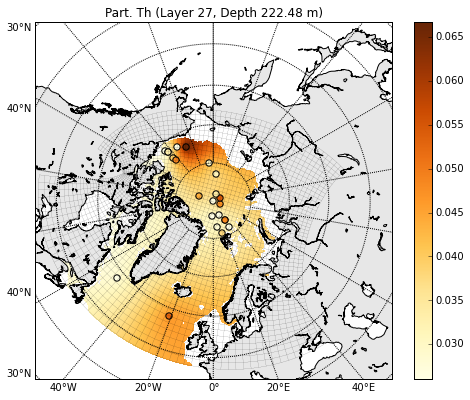

z_ma [0.07381960044705657 0.022010123701390046 0.025733024830335256
 0.025210644324475347 0.022331448445380233 0.047 0.054000000000000006
 0.03771740549041521 0.027450068722994467 0.048 0.027999999999999997
 0.12880206186660434 0.053 0.022240807565779806 -- 0.014247711338675393
 0.031716637539762844 0.03186960549043498 0.027268813105479867 --
 0.00736064647067573 0.01880991492799999 0.03696101247883419
 0.04240555616669445 0.052715538486360534]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


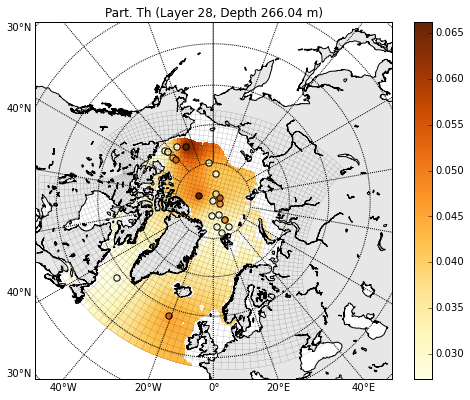

z_ma [0.11205664226372986 0.028115384882081908 0.03383365421286262
 0.02824108586705551 0.02693058913941366 0.047 0.054000000000000006
 0.042114516748276626 0.030539930687978167 0.048 0.027999999999999997
 0.12269024699081241 0.053 0.019086954376669227 -- 0.015103365421286263
 0.03431502211266309 0.033463361569199275 0.02774929270264086 --
 0.007931872873431191 0.021003333885888854 0.05091343226929479
 0.04034435001226359 0.048122041437090236]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


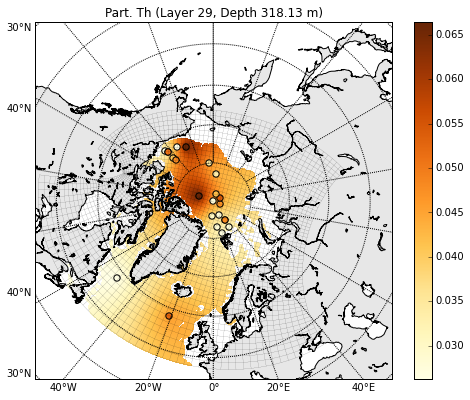

z_ma [0.15575611862564215 0.035227314919367064 0.043612558014129714
 0.0374193602717833 0.03218674993259472 0.047 0.054000000000000006
 0.047139786757261104 0.03407120150510239 0.048 0.027999999999999997
 0.11570531570419305 0.053 0.015482550731971422 -- 0.01608125580141297
 0.037284604481691935 0.03855654063235922 0.028298412242253428 --
 0.007363862597681481 0.023124473171328635 0.06685905488696404
 0.037988685835771176 0.04287233052363846]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


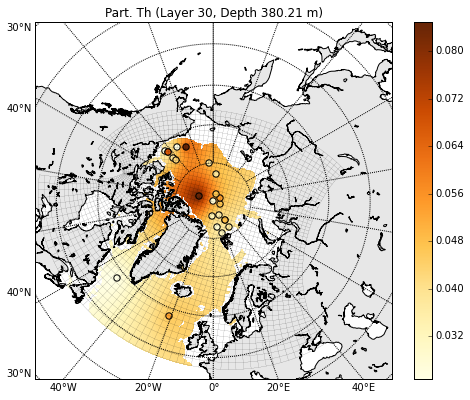

z_ma [0.15326635570797906 0.04389497965230835 0.05553059702192398
 0.05579300374213279 0.038592695899284137 0.047 0.054000000000000006
 0.053264334580710934 0.038374937813472544 0.048 0.03154680504015661
 0.10719243069862572 0.053 0.011089683789995971 -- 0.0172730597021924
 0.04090378299394584 0.04476385261558541 0.02896765168115624 --
 0.006770170577422049 0.02570961167545837 0.06693162651728636
 0.03962364273982879 0.04879829411677814]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


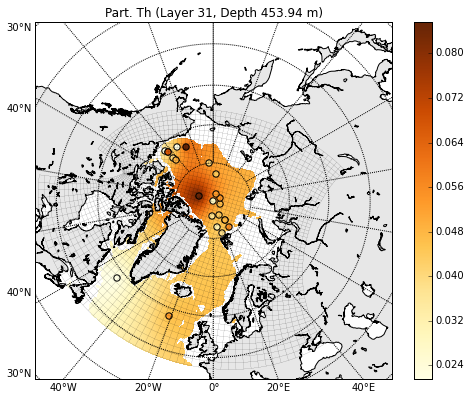

z_ma [0.12690915405612635 0.053896131267240605 0.06928218049245582
 0.06957813996859039 0.045984172014695006 0.047759630526459665
 0.054000000000000006 0.05951184494082663 0.040999999999999995
 0.049012840701946225 0.03713338582506018 0.1054031447585393 0.053
 0.013079946883210875 -- 0.018658346456265042 0.043500000000000004
 0.04850920013498966 0.02973985103373641 -- 0.0078267387706321
 0.02869246379560806 0.05885935703315984 0.0434082790834939
 0.06082752573549671]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


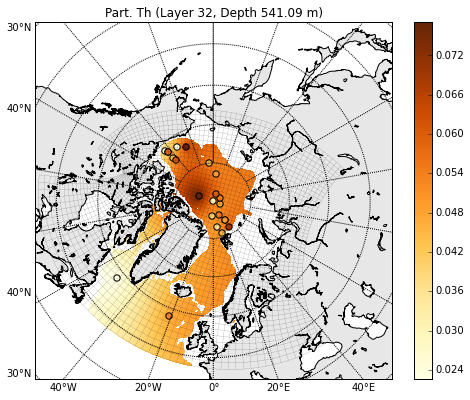

z_ma [0.09528051207390309 0.054802841043985605 0.07400000000000001
 0.07614139571588968 0.05485394335318804 0.04969344695200321
 0.054000000000000006 0.06590633125462395 0.040999999999999995
 0.05159126260267094 0.04383728276694445 0.11406664234497436 0.053
 0.021410233024013816 -- 0.020334320691736112 0.043500000000000004
 0.049005050500513646 0.030666490256832612 -- 0.008336156314132872
 0.028986159901607352 0.05477901018007713 0.04794984269589203
 0.07526260367795898]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


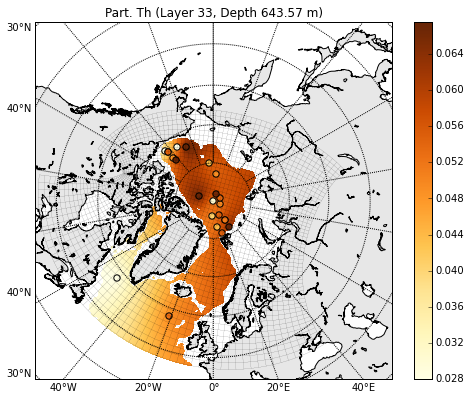

z_ma [0.0750570644641964 0.054549522401107386 0.07400000000000001
 0.08379852742107217 0.06453757151823043 0.05194956611513734
 0.054000000000000006 0.07336656528738747 0.040999999999999995
 0.054599421486849785 0.05165849586580944 0.12417405619581529 0.053
 0.029217295869456483 -- 0.02228962396645236 0.043500000000000004
 0.04958354259362496 0.03174756935044485 -- 0.008780215810368952
 0.028940504616982016 0.05893229026121914 0.053267829629271846
 0.08077402104380005]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


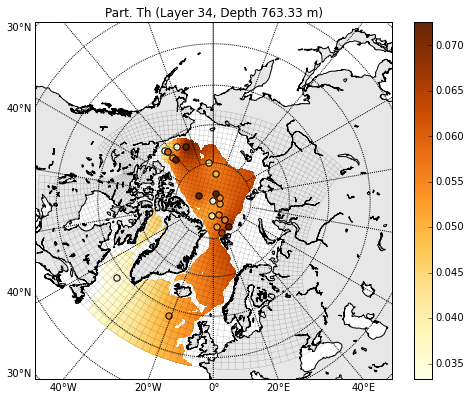

z_ma [0.06873133606775175 0.05426001538067514 0.07400000000000001
 0.09254953508413788 0.06982664208381961 0.05452798801586206
 0.054000000000000006 0.08189254703911722 0.040999999999999995
 0.05803731735448274 0.060597025121655136 0.13572538631106204 0.053
 0.021516409125958653 -- 0.024507712253259768 0.043500000000000004
 0.05024467641432361 0.03298308831457312 -- 0.010182457933527041
 0.027390236299676393 0.0706711444485072 0.05936515380454078
 0.07566844594168405]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


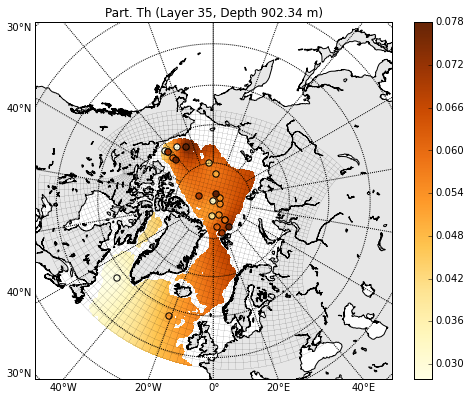

z_ma [0.06135131960523299 0.053922257190170846 0.07400000000000001
 0.1060554637874083 0.0759972244103403 0.0575361469000409
 0.054000000000000006 0.09317279560175083 0.040999999999999995
 0.062048195866721195 0.07108315393420976 0.1348346804690105 0.053
 0.01723855669337696 -- 0.025336627145789048 0.043500000000000004
 0.055288715644079646 0.034424527106056105 -- 0.012518905108634246
 0.024935415966041315 0.08985030756417817 0.062348188191941906
 0.07307719646892755]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


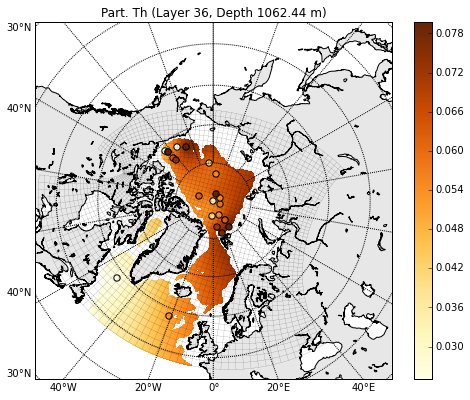

z_ma [0.06330175150614442 0.05353624782959451 0.07400000000000001
 0.16839597552048602 0.08304931849779254 0.06097404276767386
 0.05475846842827818 0.10848828464344121 0.04459052545184332
 0.06663205702356514 0.08317245808412786 0.10769822242049434 0.053
 0.02090564561885212 -- 0.0262839584515368 0.043500000000000004
 0.0610241871130909 0.036071885724893796 -- 0.013992875883251998
 0.021574352200208143 0.11647489017669815 0.058248437474003815
 0.07623352866500137]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


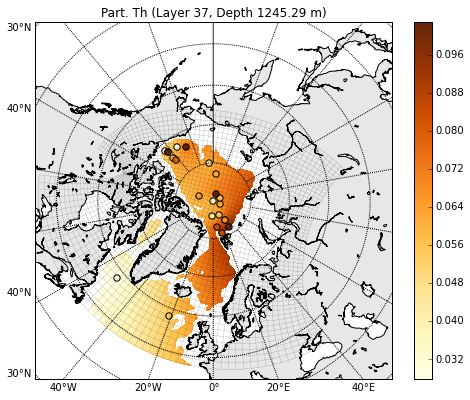

z_ma [0.10111860605010697 0.053101987298946135 0.07400000000000001
 0.23803556646858479 0.09910498246811437 0.063818672396007
 0.06094668099001751 0.12571820981534287 0.05593558181503209
 0.07178890082501459 0.09677292525278573 0.07716970711591364 0.053
 0.02906224132002334 -- 0.027349706170503016 0.043500000000000004
 0.06728534520600986 0.0379251641710862 -- 0.010801372844435799
 0.01627108608777072 0.07948384561323649 0.05363031288912835
 0.08669953831513738]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


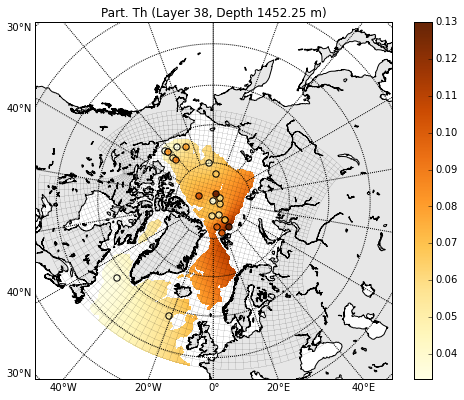

z_ma [0.11 0.05669137950280302 0.08045991412990529 0.24336157657463203
 0.15099793465269679 0.06661482770168181 0.06793706925420454
 0.14518164380582438 0.06875129363270831 0.07644528753594948
 0.11213641594330666 0.08015129363270831 0.052783385544944904
 0.03638326177492107 -- 0.03259939667682196 0.043500000000000004
 0.07435813490356648 0.040018682415859104 -- 0.01101243317777762
 0.014691986477350602 0.036935210443827485 0.050785255683829654
 0.08680243402437646]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


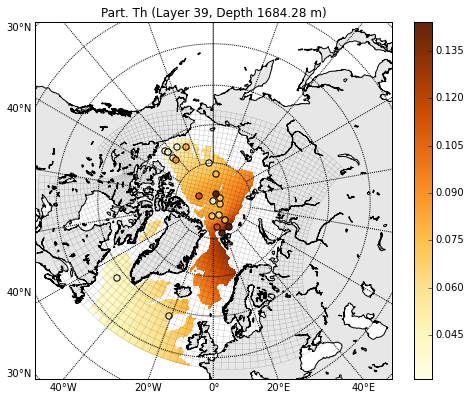

z_ma [0.11 0.06184822330425246 0.08948439078244182 0.2492551123477171
 0.23199999999999998 0.06970893398255149 0.07567233495637869
 0.16167992379116608 0.08293261408669426 0.08125834175063562
 0.13140791846891672 0.09433261408669427 0.05242411165212624
 0.03719035533914951 -- 0.0359513451477641 0.043500000000000004
 0.0821845825197152 0.042335280473599614 -- -- 0.01943501110193238
 0.041402286292372505 0.051848046563406025 0.0684926609928392]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -- -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- -- 72.45 72.52 74.5 75.28]
zzz_ma 22
xxx_dis 22
yyy_dis 22


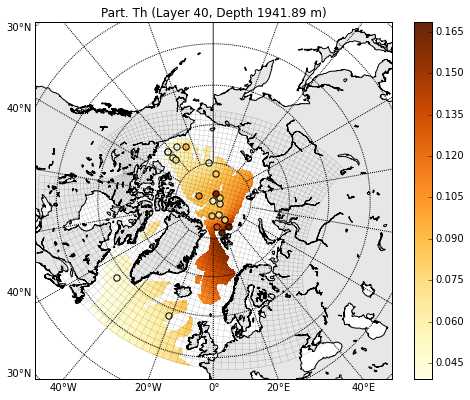

z_ma [-- -- 0.09937789111263 0.254 -- -- -- 0.16987739549332198
 0.096090165206436 0.08653487526006932 0.16985123403764796 0.10987954317699
 0.05474917396782 0.04483608677393333 -- 0.0414717511882216
 0.043500000000000004 0.08800000000000001 0.04487495834430773 -- --
 0.020587261975733594 0.042400003900000004 0.050519123937333224
 0.09439806101873091]
x_ma [-- -- 31.0 31.0 -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 -- -146.0
 -173.0 174.0 0.0 -- -- -136.93 -136.68 -137.0 -137.5]
y_ma [-- -- 84.0 82.0 -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0 80.0
 83.0 90.0 -- -- 72.45 72.52 74.5 75.28]
zzz_ma 17
xxx_dis 17
yyy_dis 17


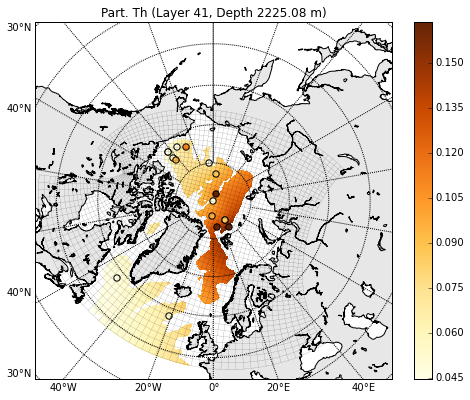

z_ma [-- -- 0.11001370232930653 0.254 -- -- -- 0.17879491538553216
 0.09670516657831256 0.1374882143292556 0.21167132732525426 0.125
 0.05254305481927136 0.05367416710843719 -- 0.050265166578312565
 0.043500000000000004 0.08800000000000001 0.048809036554536826 -- -- -- --
 0.04676024811210849 0.034420529977538555]
x_ma [-- -- 31.0 31.0 -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 -- -146.0
 -173.0 174.0 0.0 -- -- -- -- -137.0 -137.5]
y_ma [-- -- 84.0 82.0 -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0 80.0
 83.0 90.0 -- -- -- -- 74.5 75.28]
zzz_ma 15
xxx_dis 15
yyy_dis 15


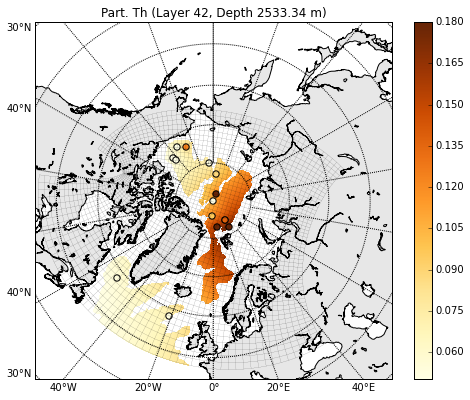

z_ma [-- -- 0.12035285582752121 0.254 -- -- -- 0.18835791735265922
 0.09736982644605494 0.1968644958475742 0.2568681983317356 0.125 --
 0.050350867769725326 -- 0.05092982644605494 -- -- -- -- -- -- --
 0.04856500111143495 0.05162900299133321]
x_ma [-- -- 31.0 31.0 -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -- -51.0 -- -146.0 --
 -- -- -- -- -- -- -137.0 -137.5]
y_ma [-- -- 84.0 82.0 -- -- -- 88.0 86.0 84.0 83.0 74.0 -- 58.0 -- 73.0 -- -- --
 -- -- -- -- 74.5 75.28]
zzz_ma 11
xxx_dis 11
yyy_dis 11


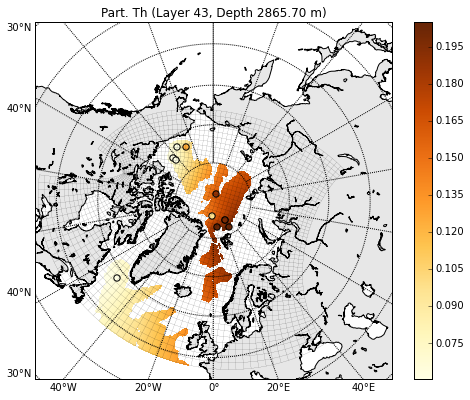

z_ma [-- -- 0.13140505439457828 -- -- -- -- 0.19688389910438897
 0.09976714835804644 0.20461012777805276 0.24532073962707623 0.125 --
 0.062209747760972406 -- 0.052476942283560674 -- -- -- -- -- -- --
 0.050494219834852874 0.058941994937020493]
x_ma [-- -- 31.0 -- -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -- -51.0 -- -146.0 -- --
 -- -- -- -- -- -137.0 -137.5]
y_ma [-- -- 84.0 -- -- -- -- 88.0 86.0 84.0 83.0 74.0 -- 58.0 -- 73.0 -- -- --
 -- -- -- -- 74.5 75.28]
zzz_ma 10
xxx_dis 10
yyy_dis 10
set values of layer 43 for the rest


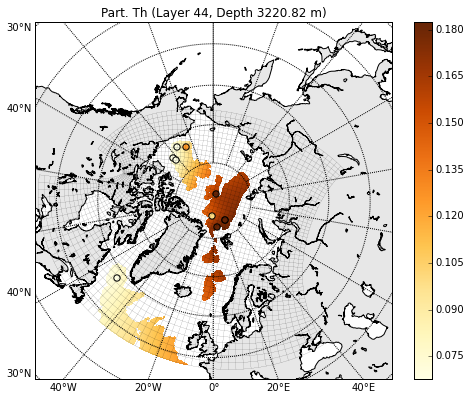

In [8]:
for i in range(44):
    write_nc(i)

#write the nc file

In [8]:
lat = nav_lat
lon = nav_lon
print lat.shape
xmax = lat.shape[1]
ymax = lat.shape[0]
depthtmax = NEMO_dep.shape[0]
print depthtmax

import os
#os.remove("/ocean/xiaoxiny/research/data/data_ANHA_Th_part.nc")
nemo = nc.Dataset('/ocean/xiaoxiny/research/data/data_ANHA_Th_part.nc', 'w')
nemo.description = 'Initial diss. Pa value' 

# dimensions
nemo.createDimension('x', xmax)
nemo.createDimension('y', ymax)
nemo.createDimension('deptht',depthtmax)
nemo.createDimension('time_counter', None)

# variables
# latitude and longitude
my_lat = nemo.createVariable('nav_lat','float32',('y','x'),zlib=True)
my_lat[:,:] = lat[:,:] 
x = nemo.createVariable('nav_lon','float32',('y','x'),zlib=True)
x[:,:]  = lon[:,:] 
# time
time_counter = nemo.createVariable('time_counter', 'float32', ('time_counter'),zlib=True)
time_counter.units = 'non-dim'
time_counter[0] = 1
# depth
depth = nemo.createVariable('deptht', 'float32', ('deptht'),zlib=True)
depth.units = 'meter'
depth[:] = ANHAdep[:]

Pa = nemo.createVariable('Th_part', 'float32', ('time_counter','deptht','y','x'), zlib=True)
Pa._units = 'arbitrary'
Pa[:,:,:,:]=Pa_ini[:,:,:,:]
nemo.close()

(800, 544)
50


In [9]:
#test .nc file

In [10]:
import glob,csv
nc_filename=glob.glob('/ocean/xiaoxiny/research/data/data_ANHA_Th_part.nc')
print("found *.nc file: \n{}".format(nc_filename))

found *.nc file: 
['/ocean/xiaoxiny/research/data/data_ANHA_Th_part.nc']


In [11]:
ptrc=nc.Dataset(nc_filename[0])
print ptrc.variables
lat=ptrc.variables['nav_lat'][:]
dept=ptrc.variables['deptht'][:]
Pa_diss=ptrc.variables['Th_part'][:]

OrderedDict([(u'nav_lat', <netCDF4.Variable object at 0x7f9426969f28>), (u'nav_lon', <netCDF4.Variable object at 0x7f9426969cc8>), (u'time_counter', <netCDF4.Variable object at 0x7f9426969d60>), (u'deptht', <netCDF4.Variable object at 0x7f941a9fab98>), (u'Th_part', <netCDF4.Variable object at 0x7f941a9fa0e8>)])


In [12]:
#test input
Pa_diss[0,0,0,0:10]#-Pa_ini[0,0,0,0:10]

array([ 0.00775255,  0.0078088 ,  0.0078656 ,  0.00792293,  0.00798081,
        0.00803922,  0.00809817,  0.00815766,  0.00821768,  0.00827824], dtype=float32)

In [13]:
dept-ANHAdep

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.], dtype=float32)

In [14]:
lat

array([[-20.07611084, -20.07611084, -20.07611084, ..., -20.07611084,
        -20.07611084, -20.07611084],
       [-19.8411274 , -19.8411274 , -19.8411274 , ..., -19.8411274 ,
        -19.8411274 , -19.8411274 ],
       [-19.605793  , -19.605793  , -19.605793  , ..., -19.605793  ,
        -19.605793  , -19.605793  ],
       ..., 
       [ 56.78784561,  56.80397415,  56.82052612, ...,  54.60116577,
         54.53417206,  54.46720886],
       [ 56.71054459,  56.72655106,  56.74296951, ...,  54.52142715,
         54.45484543,  54.38829041],
       [ 56.63286972,  56.64875031,  56.66504288, ...,  54.44150543,
         54.37533569,  54.30919266]], dtype=float32)